# Packages

In [ ]:
# Installing required packages
!pip install git+https://github.com/sajjjadayobi/FaceLib.git
!git clone https://github.com/Pongpisit-Thanasutives/Variations-of-SFANet-for-Crowd-Counting #only model

# Importing Packages
import cv2
from PIL import Image
import pandas as pd
import numpy as np
%pylab inline
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import glob

import torch
from torchvision import transforms

import os
os.chdir('/content/Variations-of-SFANet-for-Crowd-Counting')
from models import M_SFANet_UCF_QNRF

from facelib import FaceDetector, AgeGenderEstimator

  Cloning https://github.com/sajjjadayobi/FaceLib.git to /tmp/pip-req-build-3wq5v49r
  Running command git clone -q https://github.com/sajjjadayobi/FaceLib.git /tmp/pip-req-build-3wq5v49r
     |████████████████████████████████| 1.5 MB 4.4 MB/s 
  Created wheel for facelib: filename=facelib-1.6-py3-none-any.whl size=46034 sha256=a096e7c1882f5a0a1971d7915fbc4eb26e81a68433bdb24b2aad3dcec9a3f04b
  Stored in directory: /tmp/pip-ephem-wheel-cache-o1nl9x3q/wheels/55/f7/43/389753d72e4554eee6b46a9a6eb5cd7074d1008ef39dd88bc7
  Created wheel for bcolz: filename=bcolz-1.2.1-cp37-cp37m-linux_x86_64.whl size=2647558 sha256=206d044158d653a224583487df6ae53db26e06efd432025d5349993e62eded0e
  Stored in directory: /root/.cache/pip/wheels/2c/35/ca/9d914de345914e2446ea285170329f771b8abba2a00f7650bd
Successfully built facelib bcolz
Cloning into 'Variations-of-SFANet-for-Crowd-Counting'...
remote: Enumerating objects: 130, done.
remote: Total 130 (delta 0), reused 0 (delta 0), pack-reused 130
Receiving objec

# Uploading the required videos

In [ ]:
# Uploading the videos 
from google.colab import files
files.upload()
files.upload()
print('Upload model weights')
files.upload()

# Video to Image

In [ ]:
def video_to_image(path, folder):
    global exp_fld
    
    # importing video
    vidcap=cv2.VideoCapture(path)
    exp_fld=folder
    
    # error handling
    try:
        if not os.path.exists(exp_fld):
            os.makedirs(exp_fld)
    except OSError:
        print ('Error: Creating directory of data')
        
    Count = 0
    sec = 0
    frameRate = 1 # secs of the video
    
    
    while(True):
        vidcap.set(cv2.CAP_PROP_POS_MSEC,sec*1000)
        hasFrames,image = vidcap.read()
        sec = sec + frameRate
        sec = round(sec, 2)
        
        # Exporting the image
        if hasFrames:
            name='./' + exp_fld +'/frame'+str(Count) + '.jpg'
            cv2.imwrite(name, image)     # save frame as JPG file
            
            Count +=1
        else:
            break
    return print("Image Exported")

# Image Extraction

In [ ]:
os.chdir('/content')
# Extracting Images and Storing
video_to_image('HD CCTV Camera video 3MP 4MP iProx CCTV HDCCTVCameras.net retail store.mp4', 'crowd')
video_to_image('AI Security Camera with IR Night Vision (Bullet IP Camera).mp4', 'movement')
video_to_image('gender.mp4', 'gender')

Image Exported


# Functions

In [ ]:
# Resizing the image
def resize_image(density_map, image):
    density_map = 255*density_map/np.max(density_map)
    density_map= density_map[0][0]
    image= image[0]
    result_img = np.zeros((density_map.shape[0]*2, density_map.shape[1]*2))
    for i in range(result_img.shape[0]):
        for j in range(result_img.shape[1]):
            result_img[i][j] = density_map[int(i / 2)][int(j / 2)] / 4
    result_img  = result_img.astype(np.uint8, copy=False)
    return result_img


# Generating heatmap/density map
def densitymap(o, den, cc, img_paths):
    fig=plt.figure()
    columns = 2
    rows = 1
#     X = np.transpose(o, (1, 2, 0))
    X = o
    summ = int(np.sum(den))
    
    den = resize_image(den, o)
    
    # Appending original and heatmap images
    for i in range(1, columns*rows +1):
        # Original image 
        if i == 1:
            img = X
            fig.add_subplot(rows, columns, i)
            plt.gca().set_axis_off()
            plt.margins(0,0)
            plt.gca().xaxis.set_major_locator(plt.NullLocator())
            plt.gca().yaxis.set_major_locator(plt.NullLocator())
            plt.subplots_adjust(top = 1, bottom = 0, right = 1, left = 0, hspace = 0, wspace = 0)
            plt.imshow(img)
            
        # Density image
        if i == 2:
            img = den
            fig.add_subplot(rows, columns, i)
            plt.gca().set_axis_off()
            plt.margins(0,0)
            plt.gca().xaxis.set_major_locator(plt.NullLocator())
            plt.gca().yaxis.set_major_locator(plt.NullLocator())
            plt.subplots_adjust(top = 1, bottom = 0, right = 1, left = 0, hspace = 0, wspace = 0)
            plt.text(1, 80, 'M-SegNet* Est: '+str(summ)+', Gt:'+str(cc), fontsize=7, weight="bold", color = 'w')
            plt.imshow(img)#, cmap=CM.jet)
    
    # print('saving------------------',img_paths)
#     img_paths = img_paths
    filename = img_paths.split('/')[-1]
    filename = filename.replace('.jpg', '_heatpmap.png')
    # print('Save at', filename)
    plt.savefig(img_paths.split(filename)[0]+'seg_'+filename, transparent=True, bbox_inches='tight', pad_inches=0.0, dpi=200)


# Getting count of peoples
def generate_crowd_count(image):
    # Simple preprocessing.
    trans = transforms.Compose([transforms.ToTensor(), 
                                transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
                               ])

    # An example image with the label = 1236.
    img = Image.open(image).convert('RGB')
    height, width = img.size[1], img.size[0]
    height = round(height / 16) * 16
    width = round(width / 16) * 16
    img_den = cv2.resize(np.array(img), (width,height), cv2.INTER_CUBIC)
    img = trans(Image.fromarray(img_den))[None, :]

    model = M_SFANet_UCF_QNRF.Model()
    # Weights are stored in the Google drive link.
    # The model are originally trained on a GPU but, we can also test it on a CPU.
    model.load_state_dict(torch.load('/content/best_M-SFANet__UCF_QNRF.pth', 
                                     map_location = torch.device('cpu')))

    # Evaluation mode
    model.eval()
    density_map = model(img)
    # Est. count = 1168.37 (67.63 deviates from the ground truth)
    count = torch.sum(density_map).item()
    
    return count,img_den,density_map
    

# Importing Images

In [ ]:
# Getting all the images from the path
img_paths = []
path_sets = ['/content/crowd']
for path in path_sets:
    for img_path in glob.glob(os.path.join(path, '*.jpg')):
        img_paths.append(img_path)
img_paths[:3]

['/content/crowd/frame13.jpg',
 '/content/crowd/frame72.jpg',
 '/content/crowd/frame35.jpg']

# Getting crowd counts 



Downloading: "https://download.pytorch.org/models/vgg19-dcbb9e9d.pth" to /root/.cache/torch/hub/checkpoints/vgg19-dcbb9e9d.pth


  0%|          | 0.00/548M [00:00<?, ?B/s]

/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:3509: UserWarning: nn.functional.upsample is deprecated. Use nn.functional.interpolate instead.
  warnings.warn("nn.functional.upsample is deprecated. Use nn.functional.interpolate instead.")
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:3635: UserWarning: Default upsampling behavior when mode=bilinear is changed to align_corners=False since 0.4.0. Please specify align_corners=True if the old behavior is desired. See the documentation of nn.Upsample for details.
  "See the documentation of nn.Upsample for details.".format(mode)
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:1806: UserWarning: nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.
  warnings.warn("nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.")
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:3847: UserWarning: nn.functional.upsample_bilinear is deprecated. Use nn.functional.interpolate in

,image,count
72,/content/crowd/frame0.jpg,17.489319
84,/content/crowd/frame1.jpg,17.444080
28,/content/crowd/frame10.jpg,18.288996
42,/content/crowd/frame11.jpg,17.052418
27,/content/crowd/frame12.jpg,18.255342


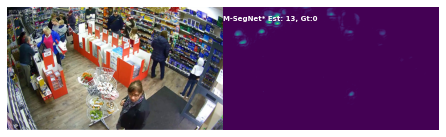

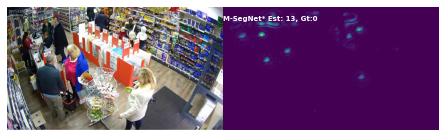

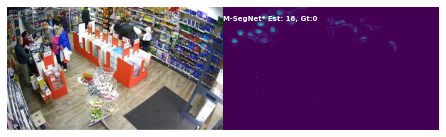

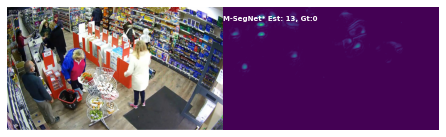

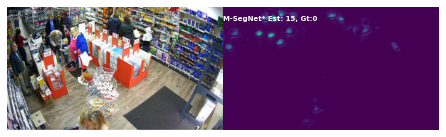

...

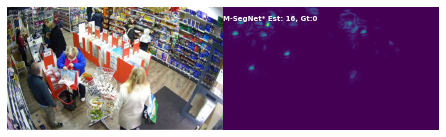

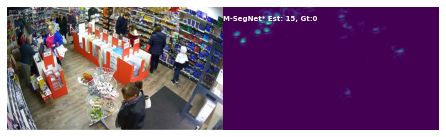

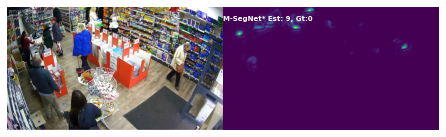

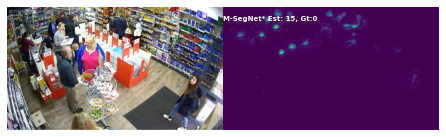

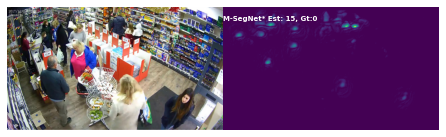

In [ ]:
# Getting the count of people by image
list_df = []
for i in img_paths :
    count, img_den, density_map = generate_crowd_count(i)
    densitymap(img_den, density_map.cpu().detach().numpy(), 0, i)
    list_df = list_df + [[i,count]]
df = pd.DataFrame(list_df,columns=['image','count'])
df.sort_values(['image']).head()

In [ ]:
df.head()

,image,count
0,/content/crowd/frame13.jpg,13.187809
1,/content/crowd/frame72.jpg,13.744847
2,/content/crowd/frame35.jpg,16.155399
3,/content/crowd/frame79.jpg,13.896362
4,/content/crowd/frame50.jpg,15.169355


In [ ]:
df['count'].max()

23.906431198120117

In [ ]:
df.describe()

,count
count,98.000000
mean,15.854166
std,2.938520
min,9.216686
25%,13.796471
50%,15.745502
75%,17.762216
max,23.906431


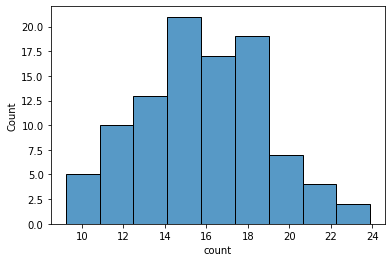

In [ ]:
import seaborn as sns
sns.histplot(data=df['count'])

# Getting Heatmap

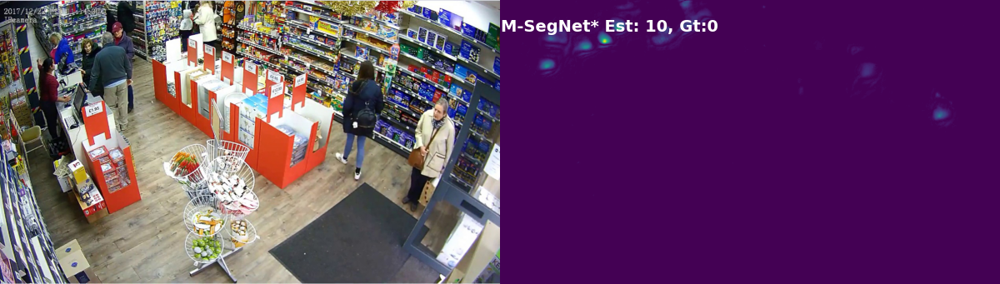

In [ ]:
image = '/content/crowd/frame97.jpgseg_frame97_heatpmap.png'
Image.open(image)

# Movement Detection

In [ ]:
# Getting all the images from the path
img_paths = []
path_sets = ['/content/movement']
for path in path_sets:
    for img_path in glob.glob(os.path.join(path, '*.jpg')):
        img_paths.append(img_path)
img_paths[:3]

['/content/movement/frame12.jpg',
 '/content/movement/frame26.jpg',
 '/content/movement/frame40.jpg']

In [ ]:
# Getting the count of people by image
list_df = []
for i in img_paths :
    count, img_den, density_map = generate_crowd_count(i)
    densitymap(img_den, density_map.cpu().detach().numpy(), 0, i)
    list_df = list_df + [[i,count]]
detected_df = pd.DataFrame(list_df,columns=['image','count'])
detected_df['movement'] = np.where(detected_df['count'] > 3 ,'yes','no')
detected_df.filter(items = [45,56,53], axis=0)

,image,count,movement
45,/content/movement/frame31.jpg,2.973071,no
56,/content/movement/frame46.jpg,2.144534,no
53,/content/movement/frame33.jpg,3.724376,yes


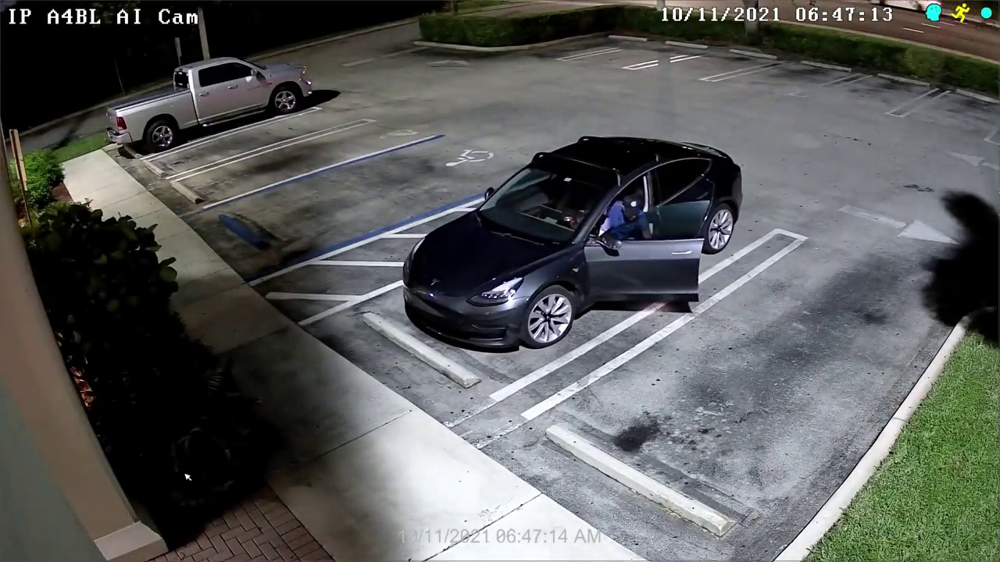

In [ ]:
image = '/content/movement/frame25.jpg'
Image.open(image)

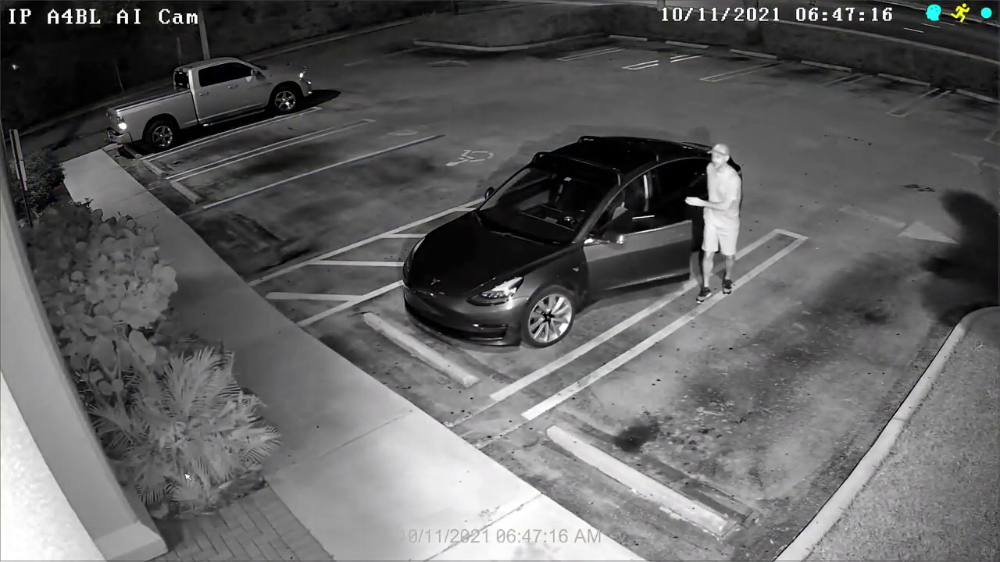

In [ ]:
image = '/content/movement/frame27.jpg'
Image.open(image)

# Age and Gender detection

In [ ]:
# Importing functions
face_detector = FaceDetector()
age_gender_detector = AgeGenderEstimator()


from FaceDetector: download defualt weight started


100%|██████████| 1.79M/1.79M [00:00<00:00, 22.2MiB/s]


the default model weight donwloaded
from FaceDetector: weights loaded
from AgeGenderEstimator: download defualt weight started


100%|██████████| 5.17M/5.17M [00:00<00:00, 24.1MiB/s]


the default model weight donwloaded
from AgeGenderEstimator: weights loaded


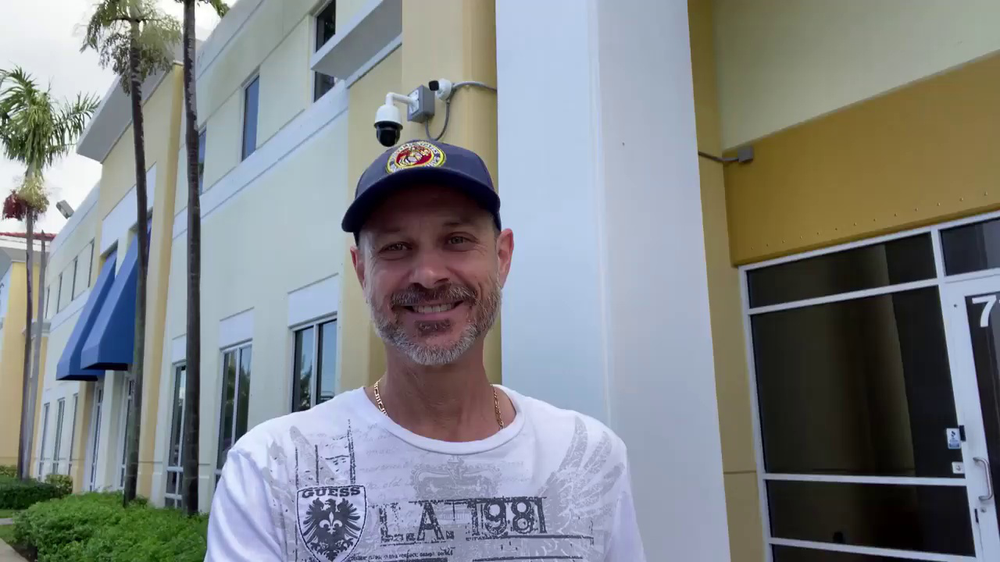

In [ ]:
# Reading image
img = '/content/gender/frame0.jpg'
image = cv2.imread(img, cv2.IMREAD_UNCHANGED)
Image.open(img)

In [ ]:
faces, boxes, scores, landmarks = face_detector.detect_align(image)
genders, ages = age_gender_detector.detect(faces)
print(genders, ages)

['Male'] [32]


/usr/local/lib/python3.7/dist-packages/facelib/Retinaface/Retinaface.py:165: UserWarning: Creating a tensor from a list of numpy.ndarrays is extremely slow. Please consider converting the list to a single numpy.ndarray with numpy.array() before converting to a tensor. (Triggered internally at  ../torch/csrc/utils/tensor_new.cpp:201.)
  faces = torch.tensor(warped).to(self.device)
